In [1]:
import phate
import argparse
import random

import scipy.sparse as sp
import scipy.sparse.csgraph
import sklearn.linear_model as sklm
import sklearn.metrics as skm
import sklearn.model_selection as skms
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from ignite.engine import Engine, Events
from ignite.handlers import ModelCheckpoint
from torch.utils.data import DataLoader, IterableDataset, get_worker_info

CHECKPOINT_PREFIX = "g2g"

from utils import *
# from minepy import MINE
from sklearn.preprocessing import MinMaxScaler

In [2]:
from sklearn.neighbors import kneighbors_graph
from sklearn.neighbors import NearestNeighbors

In [3]:

method = ''
from g2g_model_Fisher import *

In [4]:
model_name = 'phate'
result_path = 'results/'+model_name+'/'
figure_path = 'results/'
cmap = plt.colormaps['Spectral_r']

In [5]:
import os

folder = os.path.exists(result_path)
if not folder:                   #判断是否存在文件夹如果不存在则创建为文件夹
    os.makedirs(result_path) 

### PHATE 数据生成

In [9]:
n_dim = 200
n_branch,branch_length = 3,600
n_samples = n_branch * branch_length

In [8]:
tree, branches = phate.tree.gen_dla(n_dim = n_dim, n_branch = n_branch, branch_length = branch_length, 
                                    rand_multiplier = 2, seed=37, sigma = 5)
print(tree.shape, branches.shape)

phate_operator = phate.PHATE(n_jobs=-2)
tree_phate = phate_operator.fit_transform(tree)

(1800, 200) (1800,)
Calculating PHATE...
  Running PHATE on 1800 observations and 200 variables.
  Calculating graph and diffusion operator...
    Calculating PCA...
    Calculated PCA in 0.16 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.10 seconds.
    Calculating affinities...
    Calculated affinities in 0.06 seconds.
  Calculated graph and diffusion operator in 0.32 seconds.
  Calculating optimal t...
    Automatically selected t = 9
  Calculated optimal t in 2.68 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.59 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 4.45 seconds.
Calculated PHATE in 8.06 seconds.


C:\Users\76745\AppData\Local\Temp\ipykernel_4036\1195636226.py:1: DeprecationWarning: Call to deprecated function (or staticmethod) scatter2d. (Use scprep.plot.scatter2d instead) -- Deprecated since version 1.0.0.
  phate.plot.scatter2d(tree_phate, c=branches, figsize=(8,6))


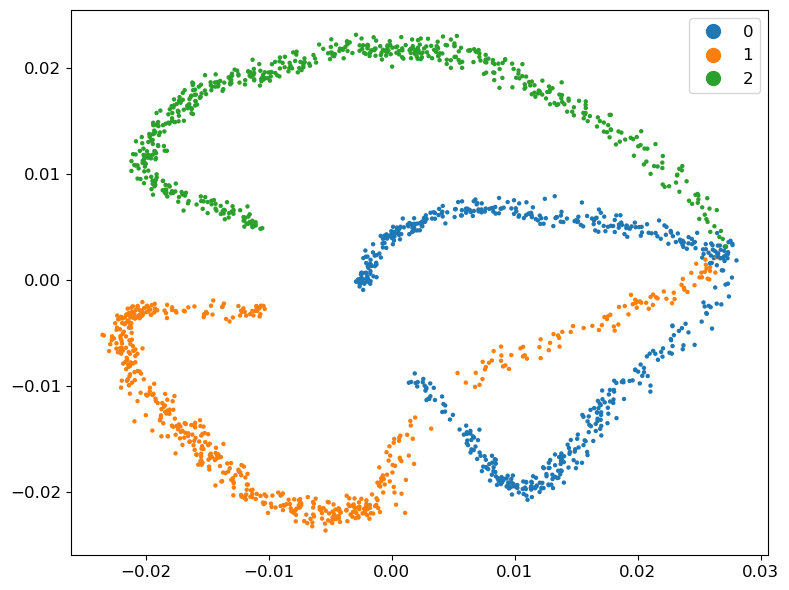

Calculating PHATE...
  Running PHATE on 1800 observations and 200 variables.
  Calculating graph and diffusion operator...
    Calculating PCA...
    Calculated PCA in 0.06 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.09 seconds.
    Calculating affinities...
    Calculated affinities in 0.01 seconds.
  Calculated graph and diffusion operator in 0.17 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 1.20 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 4.47 seconds.
Calculated PHATE in 5.87 seconds.


C:\Users\76745\AppData\Local\Temp\ipykernel_4036\1195636226.py:6: DeprecationWarning: Call to deprecated function (or staticmethod) scatter2d. (Use scprep.plot.scatter2d instead) -- Deprecated since version 1.0.0.
  phate.plot.scatter2d(tree_phate_sqrt, c=branches, figsize=(8,6))


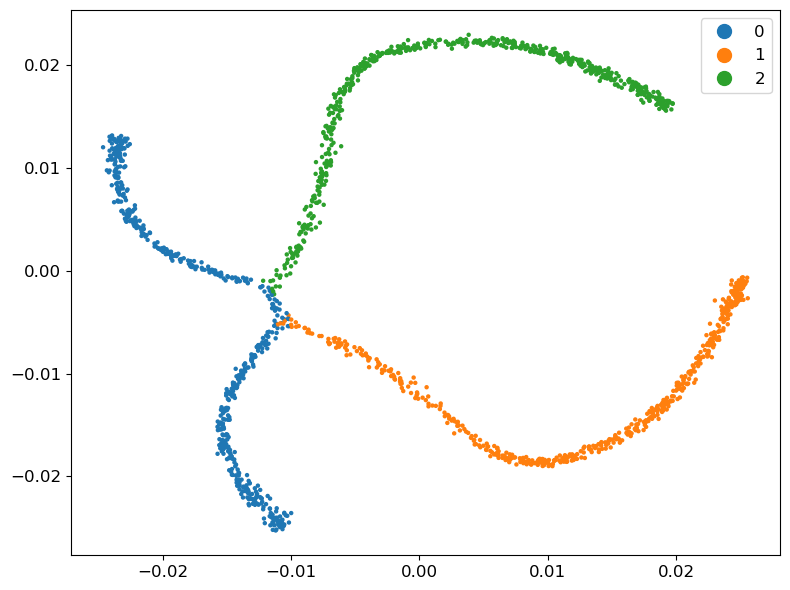

<Axes: >

In [9]:
phate.plot.scatter2d(tree_phate, c=branches, figsize=(8,6))

phate_operator.set_params(gamma=0, t=120)
tree_phate_sqrt = phate_operator.fit_transform(tree)

phate.plot.scatter2d(tree_phate_sqrt, c=branches, figsize=(8,6))

Calculating metric MDS...


C:\Users\76745\AppData\Local\Temp\ipykernel_4036\4144509354.py:6: DeprecationWarning: Call to deprecated function (or staticmethod) scatter3d. (Use scprep.plot.scatter3d instead) -- Deprecated since version 1.0.0.
  phate.plot.scatter3d(phate_operator, c=branches, figsize=(8,6))
C:\Users\76745\anaconda3\envs\pytorch\lib\site-packages\sklearn\manifold\_mds.py:298: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


Calculated metric MDS in 20.42 seconds.


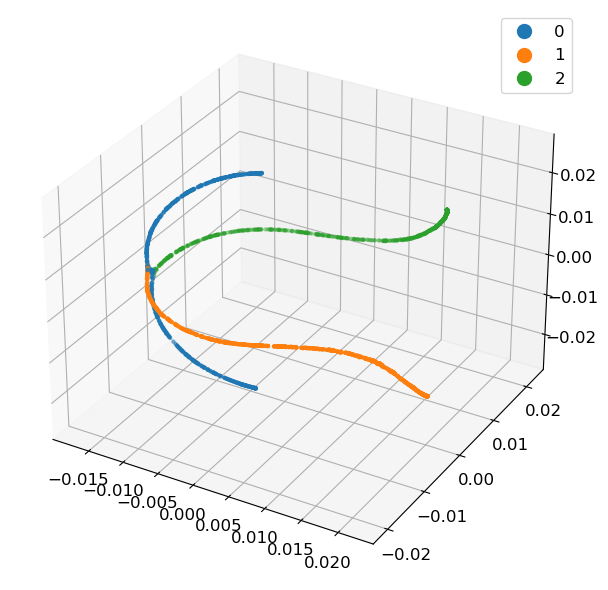

<Axes3D: >

In [10]:
# pass the phate operator to avoid recomputing in 3D
# alternatively:
# >>> phate_operator.set_params(n_components=3)
# >>> tree_phate_sqrt = phate_operator.transform()
# >>> phate.plot.scatter3d(tree_phate_sqrt, c=branches, figsize=(8,6))
phate.plot.scatter3d(phate_operator, c=branches, figsize=(8,6))

In [11]:
phate.plot.rotate_scatter3d(phate_operator, c=branches, figsize=(8,6))
# to save as a gif:
# >>> phate.plot.rotate_scatter3d(phate_operator, c=branches, figsize=(8,6), filename="phate.gif")
# to save as an mp4:
# >>> phate.plot.rotate_scatter3d(phate_operator, c=branches, figsize=(8,6), filename="phate.mp4")

C:\Users\76745\AppData\Local\Temp\ipykernel_4036\248075090.py:1: DeprecationWarning: Call to deprecated function (or staticmethod) rotate_scatter3d. (Use scprep.plot.rotate_scatter3d instead) -- Deprecated since version 1.0.0.
  phate.plot.rotate_scatter3d(phate_operator, c=branches, figsize=(8,6))


In [13]:
X_major = phate.plot._get_plot_data(phate_operator,ndim=3)
X_major.shape

(1800, 3)

C:\Users\76745\AppData\Roaming\Python\Python310\site-packages\scprep\plot\utils.py:99: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  fig.tight_layout()


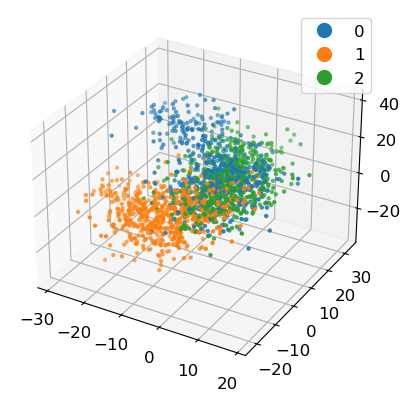

<Axes3D: >

In [44]:
import scprep
scprep.plot.scatter3d(X_major,c = branches)

In [15]:
X_minor=0.005*np.random.randn(n_samples,7)
X = np.hstack((X_major,X_minor))
X.shape

(1800, 10)

In [40]:
np.save(result_path+'X_major',X_major)
np.save(result_path+'branches',branches)
np.save(result_path+'X',X)
np.save(result_path+'tree',tree)

In [16]:
###Z坐标作color_label
#color_label=np.zeros((n_samples))
#color_label[np.argsort(tree[:,1])]=np.arange(n_samples)

##生成pseudotime 
pt0 = np.random.uniform(0, 1, branch_length)
pt0 = pt0[pt0.argsort()]

M = X_major[:branch_length,2]
indexM = M.argsort()
start1 = X_major[branch_length,2]
start2 = X_major[2*branch_length,2]
start_pt1 = (pt0[np.argmax(M[indexM] > start1)] + pt0[np.argmax(M[indexM] > start1) - 1])/2
start_pt2 = (pt0[np.argmax(M[indexM] > start2)] + pt0[np.argmax(M[indexM] > start2) - 1])/2
pt1,pt2 = np.random.uniform(start_pt1, 1, branch_length),np.random.uniform(start_pt2, 1, branch_length)
pt1,pt2 = pt1[pt1.argsort()],pt2[pt2.argsort()]

color_label = np.hstack((pt0,pt1,pt2))

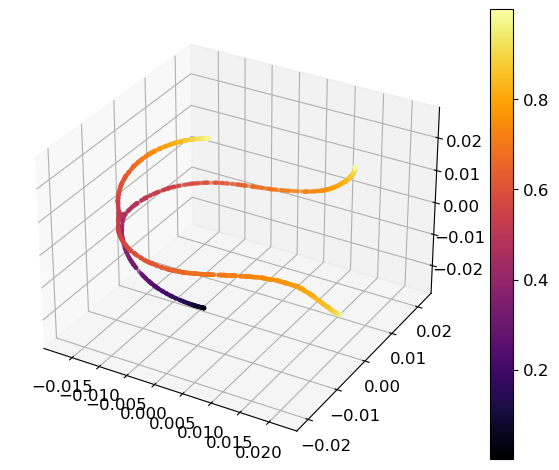

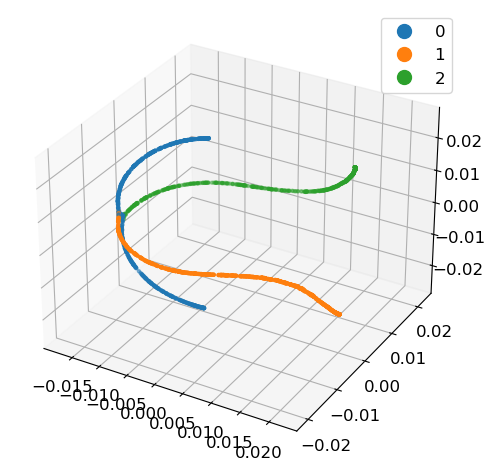

<Axes3D: >

In [19]:
scprep.plot.scatter3d(X_major,c = color_label)

cc = branches.copy()
#cc[branch_length] = 300
#cc[branch_length -1] = 300

scprep.plot.scatter3d(X_major,c = cc)

In [21]:
np.save(result_path+'color_label',color_label)

(1800, 3)


C:\Users\76745\AppData\Roaming\Python\Python310\site-packages\scprep\plot\utils.py:99: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  fig.tight_layout()


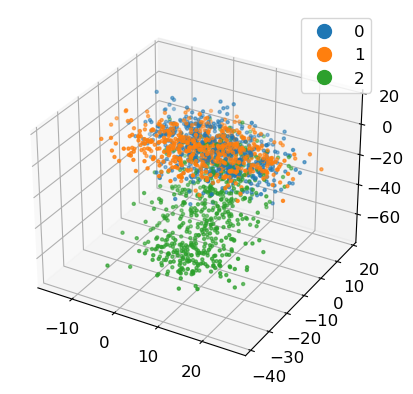

<Axes3D: >

In [57]:
print(X_major[:,:3].shape)
scprep.plot.scatter3d(X_major[:,4:7],c = branches)

### PHATE 数据导入

In [12]:
X_major = np.load(result_path+'X_major.npy')
branches = np.load(result_path+'branches.npy')
X = np.load(result_path+'X.npy')
tree = np.load(result_path+'tree.npy')
color_label = np.load(result_path+'color_label.npy')

In [13]:
n_samples,n_dim = tree.shape
n_branches = np.max(branches)+1
branch_length = int(n_samples/n_branches)

### GE

In [16]:
k_nei = 10
A = kneighbors_graph(X, k_nei, mode='connectivity', include_self=True)
# A=radius_neighbors_graph(X,3,include_self=True)
X_major = X[:,:3]

row =np.array([np.ones((k_nei,))*i for i in range(n_samples)]).flatten()
col=A.indices
w_val=np.array([np.linalg.norm(X_major[int(i),:]-X_major[int(j),:]) for i,j in zip(row,col)])
dc=np.mean(w_val)

cell_nei=A.indices.reshape(X.shape[0],10)
nei_w=[]
rho_arr=[]
for ni in cell_nei:
    dij=np.array([np.linalg.norm(X_major[int(ni[0]),:]-X_major[int(i),:]) for i in ni[1:]])
    rho=np.sum(np.exp(-dij**2/dc**2))
#     rho=np.exp(np.sum(-dij**2/dc**2))
    nei_w.append(np.exp(-dij**2/dc**2)/np.sum(np.exp(-dij**2/dc**2)))
#     print(dij)
#     print(np.exp(-dij**2/dc**2)/np.sum(np.exp(-dij**2/dc**2)))
    rho_arr.append(rho)
rho_arr=np.array(rho_arr)/np.amax(rho_arr)
nei_w=np.array(nei_w)
nei_w=np.hstack((np.ones((nei_w.shape[0],1)),nei_w))/2

# plt.scatter(X_pca[:,0],X_pca[:,1],s=5,c=rho_arr,cmap=plt.cm.jet)
# plt.colorbar()
# plt.show()

def smooth_func(X_val,cell_nei=cell_nei,nei_w=nei_w):
    X_s=X_val.copy()
    for ci in range(len(X_val)):
        X_s[ci]=np.dot(X_val[cell_nei[ci,:]],nei_w[ci,:])
    return X_s

In [20]:
####不用phate处理
#X = np.hstack((X_major,X_minor))
X = tree
k_nei = 10
A = kneighbors_graph(X, k_nei, mode='connectivity', include_self=True)
# A=radius_neighbors_graph(X,3,include_self=True)
X_major = X

row =np.array([np.ones((k_nei,))*i for i in range(n_samples)]).flatten()
col=A.indices
w_val=np.array([np.linalg.norm(X_major[int(i),:]-X_major[int(j),:]) for i,j in zip(row,col)])
dc=np.mean(w_val)

cell_nei=A.indices.reshape(X.shape[0],10)
nei_w=[]
rho_arr=[]
for ni in cell_nei:
    dij=np.array([np.linalg.norm(X_major[int(ni[0]),:]-X_major[int(i),:]) for i in ni[1:]])
    rho=np.sum(np.exp(-dij**2/dc**2))
#     rho=np.exp(np.sum(-dij**2/dc**2))
    nei_w.append(np.exp(-dij**2/dc**2)/np.sum(np.exp(-dij**2/dc**2)))
#     print(dij)
#     print(np.exp(-dij**2/dc**2)/np.sum(np.exp(-dij**2/dc**2)))
    rho_arr.append(rho)
rho_arr=np.array(rho_arr)/np.amax(rho_arr)
nei_w=np.array(nei_w)
nei_w=np.hstack((np.ones((nei_w.shape[0],1)),nei_w))/2

# plt.scatter(X_pca[:,0],X_pca[:,1],s=5,c=rho_arr,cmap=plt.cm.jet)
# plt.colorbar()
# plt.show()

def smooth_func(X_val,cell_nei=cell_nei,nei_w=nei_w):
    X_s=X_val.copy()
    for ci in range(len(X_val)):
        X_s[ci]=np.dot(X_val[cell_nei[ci,:]],nei_w[ci,:])
    return X_s

In [58]:
epochs = 200
nsamples = 3
learning_rate = 1e-3
# n_workers = 4
K = 4
L = 3
#     checkpoint_path = args.checkpoint
#     checkpoints_path = args.checkpoints
#     dataset_path = args.dataset

In [59]:
kk = 2
for i in range(kk):
    reset_seeds(i*2+1)
    A=A.astype(np.float32)
    X=X.astype(np.float32)
    z=color_labelminkowski

    n = A.shape[0]
    train_nodes, val_nodes = train_test_split(n, train_ratio=1)
    A_train = A[train_nodes, :][:, train_nodes]
    X_train = X[train_nodes]
    z_train = z[train_nodes]
    A_val = A[val_nodes, :][:, val_nodes]
    X_val = X[val_nodes]
    z_val = z[val_nodes]

    train_data = AttributedGraph(A_train, X_train, z_train, K)
    val_data = AttributedGraph(A_val, X_val, z_val, K)
    
    encoder = Encoder(X.shape[1], L)
    optimizer = optim.Adam(encoder.parameters(), lr=learning_rate)
    iterations = epochs #// n_workers
    dataset = GraphDataset(train_data, nsamples, iterations)
    loader = DataLoader(
        dataset,
        batch_size=1,
        #num_workers=n_workers,
        worker_init_fn=reset_seeds,
        collate_fn=lambda args: args,
    )
    
    for batch_idx, data in enumerate(loader):
        encoder.train()
        optimizer.zero_grad()

        loss = encoder.compute_loss(data[0][0],data[0][1],data[0][2],data[0][3],data[0][4],data[0][5])

        if batch_idx% 10 == 0:
            print(batch_idx,loss)
        loss.backward()
        optimizer.step()
        
    torch.save(encoder,result_path+'encoder'+str(i)+'.pt')
    
    mu, sigma = encoder(torch.FloatTensor(X))
    X_mu = mu.detach().numpy()
    X_sigma = sigma.detach().numpy()#The learned sigma is variance

#     cRc_arr=[]
    cRc_arr_eu=[]
#     cRc_arr_mueu=[]
    mu_learned = X_mu
    sigma_learned = X_sigma

    for inds in np.split(A.indices, A.indptr)[1:-1]:
        self_ind=inds[0]
#         cRc=0
        cRc_eu=0
#         cRc_mueu=0
        for nei_k in range(1,len(inds)):
            dEu=np.linalg.norm(X[self_ind,:]-X[inds[nei_k],:])
#             dMuEu=np.linalg.norm(X_mu[self_ind,:]-X_mu[inds[nei_k],:])
#             dFi=Fisher_dist(mu_learned[self_ind,:],sigma_learned[self_ind,:],\
#                             mu_learned[inds[nei_k],:],sigma_learned[inds[nei_k],:])
            dWa=wasserstein_distance(mu_learned[self_ind,:],sigma_learned[self_ind,:],\
                            mu_learned[inds[nei_k],:],sigma_learned[inds[nei_k],:])

#             cRc += 1-dWa/dFi
            cRc_eu += 1-dWa/dEu
#             cRc_mueu += 1-dWa/dMuEu

#         cRc_arr.append(cRc/len(inds))
        cRc_arr_eu.append(cRc_eu/len(inds))
#         cRc_arr_mueu.append(cRc_mueu/len(inds))
#     orc = np.array(cRc_arr)
    orc_eu = np.array(cRc_arr_eu)
#     orc_mueu = np.array(cRc_arr_mueu)
    
    np.save(result_path+'crc'+str(i),orc_eu)

0 tensor(1.7899e+11, grad_fn=<DivBackward0>)
10 tensor(4.9846e+08, grad_fn=<DivBackward0>)
20 tensor(3.8153e+08, grad_fn=<DivBackward0>)
30 tensor(3.4856e+08, grad_fn=<DivBackward0>)
40 tensor(3.2857e+08, grad_fn=<DivBackward0>)
50 tensor(3.1876e+08, grad_fn=<DivBackward0>)
60 tensor(3.0509e+08, grad_fn=<DivBackward0>)
70 tensor(2.9789e+08, grad_fn=<DivBackward0>)
80 tensor(2.8545e+08, grad_fn=<DivBackward0>)
90 tensor(2.7681e+08, grad_fn=<DivBackward0>)
100 tensor(2.6949e+08, grad_fn=<DivBackward0>)
110 tensor(2.6340e+08, grad_fn=<DivBackward0>)
120 tensor(2.5832e+08, grad_fn=<DivBackward0>)
130 tensor(2.4668e+08, grad_fn=<DivBackward0>)
140 tensor(2.4396e+08, grad_fn=<DivBackward0>)
150 tensor(2.3374e+08, grad_fn=<DivBackward0>)
160 tensor(2.3305e+08, grad_fn=<DivBackward0>)
170 tensor(2.2461e+08, grad_fn=<DivBackward0>)
180 tensor(2.2299e+08, grad_fn=<DivBackward0>)
190 tensor(2.1974e+08, grad_fn=<DivBackward0>)
0 tensor(4.4394e+11, grad_fn=<DivBackward0>)
10 tensor(1.0379e+09, grad

In [17]:
encoders = [0]*kk
mus = [0]*kk
sgms = [0]*kk
crcs_smooth = [0]*kk
for i in range(kk):
    encoders[i] = torch.load(result_path+'encoder'+str(i)+'.pt')
    mu, sigma = encoders[i](torch.FloatTensor(X))
    mus[i] = mu.detach().numpy()
    sgms[i] = sigma.detach().numpy()
    crcs_smooth[i] = smooth_func(np.load(result_path+'crc'+str(i)+'.npy'))
encoders = np.array(encoders)
mus = np.array(mus)
sgms = np.array(sgms)
crcs_smooth = np.array(crcs_smooth)

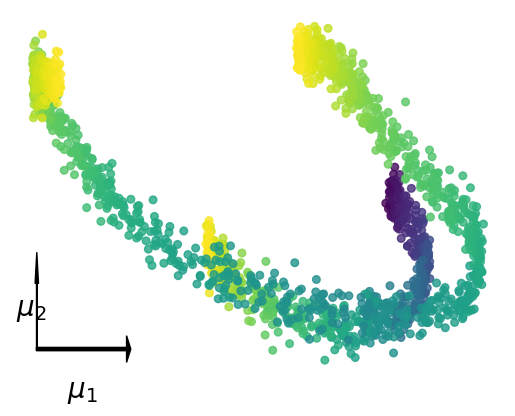

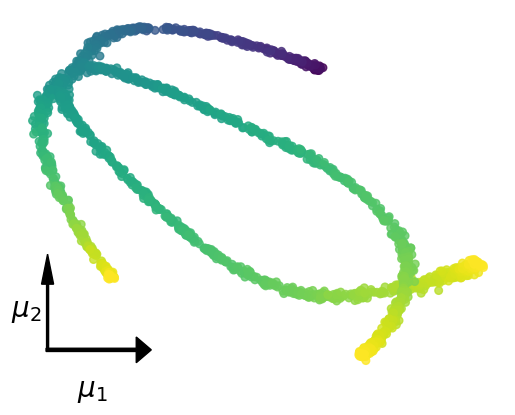

In [18]:
for nkk in range(kk):
    X_plt = mus[nkk,:,0]
    Y_plt = mus[nkk,:,1]
    X_min = np.min(X_plt)
    X_max = np.max(X_plt)
    Y_min = np.min(Y_plt)
    Y_max = np.max(Y_plt)
    X_len = (X_max-X_min)/5
    Y_len = (Y_max-Y_min)/5
    wid = min(X_len,Y_len)/30
    X_ori = X_min+5*wid
    Y_ori = Y_min+5*wid
    
    plt.scatter(X_plt,Y_plt,s=30,alpha=0.8,c=color_label,cmap='viridis')
    plt.axis('off')
    
    plt.arrow(X_ori-wid/2,Y_ori,X_len,0,width=wid*1.5,color='black',head_width=12*wid,head_length=5*wid)
    plt.arrow(X_ori,Y_ori-wid/2,0,Y_len,width=wid*2/3,color='black',head_width=4*wid,head_length=14*wid)
    
    plt.text(X_ori+X_len/2,Y_ori-wid*22,'$\mu_1$',fontsize=20,ha='center',weight='bold')
    plt.text(X_ori-wid*7,Y_ori+Y_len/2,'$\mu_2$',fontsize=20,ha='center',weight='bold')
    
    # plt.savefig(result_path+model_name+'_mu.png',dpi=600,bbox_inches='tight')
    plt.show()

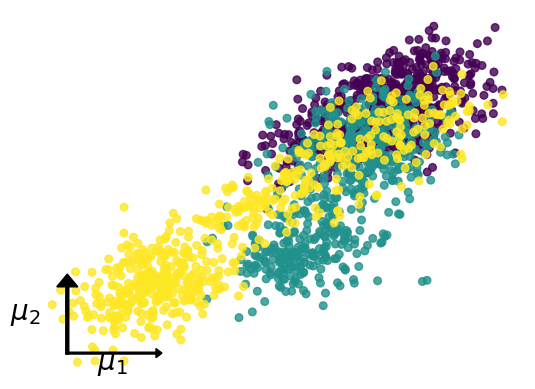

In [62]:
nkk = 1
X_plt = mus[nkk,:,0]
Y_plt = mus[nkk,:,1]
X_min = np.min(X_plt)
X_max = np.max(X_plt)
Y_min = np.min(Y_plt)
Y_max = np.max(Y_plt)
X_len = (X_max-X_min)/5
Y_len = (Y_max-Y_min)/5
wid = min(X_len,Y_len)/30
X_ori = X_min+5*wid
Y_ori = Y_min+5*wid

plt.scatter(X_plt,Y_plt,s=30,alpha=0.8,c=branches,cmap='viridis')
plt.axis('off')

plt.arrow(X_ori-wid/2,Y_ori,X_len,0,width=wid,color='black',head_width=5*wid,head_length=kk*wid)
plt.arrow(X_ori,Y_ori-wid/2,0,Y_len,width=wid,color='black',head_width=7*wid,head_length=7*wid)

plt.text(X_ori+X_len/2,Y_ori-wid*9,'$\mu_1$',fontsize=20,ha='center',weight='bold')
plt.text(X_ori-wid*14,Y_ori+Y_len/2,'$\mu_2$',fontsize=20,ha='center',weight='bold')

plt.savefig(figure_path+'2b1.png',dpi=600,bbox_inches='tight')
plt.show()

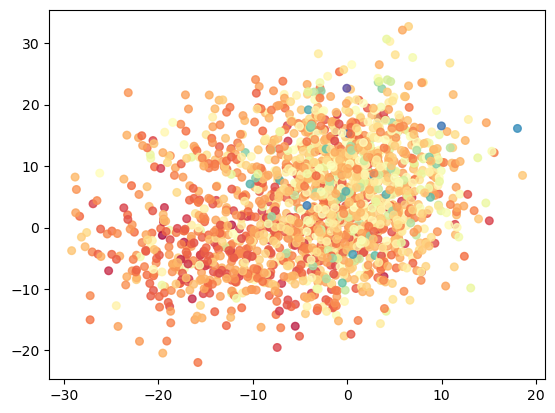

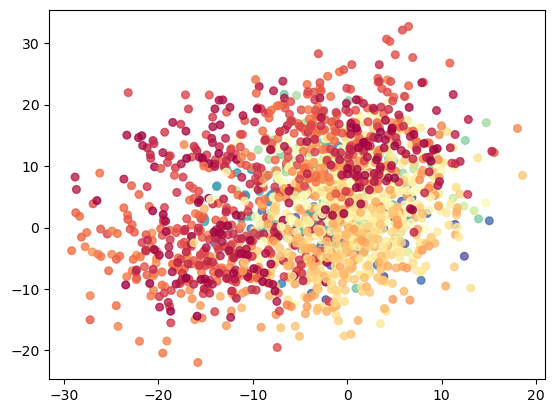

In [63]:
plt.scatter(
    X[:, 0], X[:, 1], c=crcs_smooth[1,:], s=30, alpha=0.8,cmap=cmap
    # X[:, 0], X[:, 1], c=np.mean(crcs_smooth,axis=0), s=30, alpha=0.8,cmap=cmap
)
plt.show()
plt.scatter(
    X[:, 0], X[:, 1], c=color_label, s=30, alpha=0.8,cmap=cmap
    # X[:, 0], X[:, 1], c=np.mean(crcs_smooth,axis=0), s=30, alpha=0.8,cmap=cmap
)
plt.show()

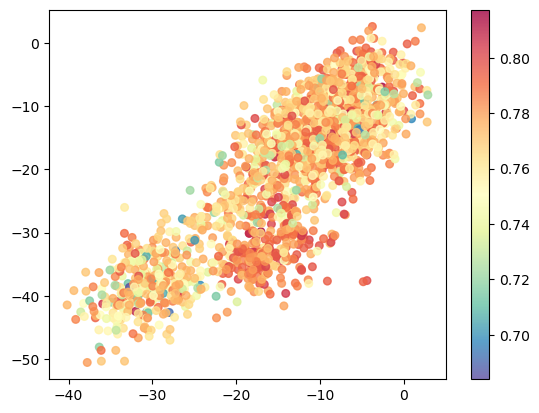

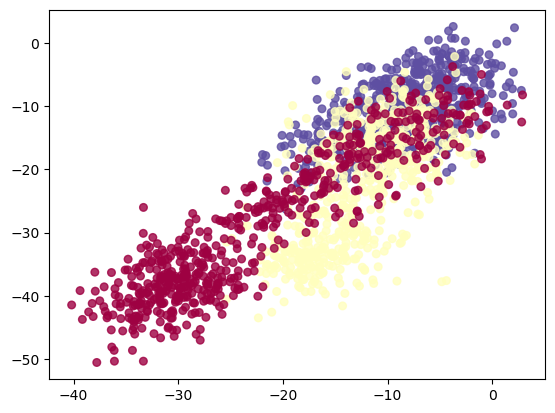

In [64]:
plt.scatter(
    X_plt,Y_plt, c=crcs_smooth[1,:], s=30, alpha=0.8,cmap=cmap
    # X[:, 0], X[:, 1], c=np.mean(crcs_smooth,axis=0), s=30, alpha=0.8,cmap=cmap
)
plt.colorbar()
plt.show()
plt.scatter(
    X_plt,Y_plt, c=branches, s=30, alpha=0.8,cmap=cmap
    # X[:, 0], X[:, 1], c=np.mean(crcs_smooth,axis=0), s=30, alpha=0.8,cmap=cmap
)
plt.show()

Text(0, 0.5, 'curvature')

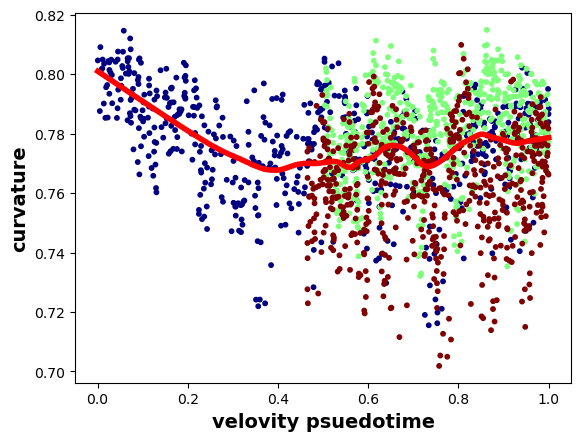

In [65]:
mask,x_ls,y_ls= kde_lowess(color_label, crcs_smooth[1,:])
plt.scatter(color_label[mask], crcs_smooth[1,mask],s=10,c=branches[mask],cmap=plt.cm.jet)
plt.plot(x_ls, y_ls, linewidth=4,color='red')
plt.xlabel('velovity psuedotime',fontsize=14,weight='bold')
plt.ylabel('curvature',fontsize=14,weight='bold')

C:\Users\76745\AppData\Local\Temp\ipykernel_29320\3342221902.py:2: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(color_label[:branch_length][mask], crcs_smooth[1,:branch_length][mask],s=10,cmap=plt.cm.jet)
C:\Users\76745\AppData\Local\Temp\ipykernel_29320\3342221902.py:5: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(color_label[branch_length:2*branch_length][mask], crcs_smooth[1,branch_length:2*branch_length][mask],s=10,cmap=plt.cm.jet)
C:\Users\76745\AppData\Local\Temp\ipykernel_29320\3342221902.py:8: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(color_label[2*branch_length:][mask], crcs_smooth[1,2*branch_length:][mask],s=10,cmap=plt.cm.jet)


Text(0, 0.5, 'curvature')

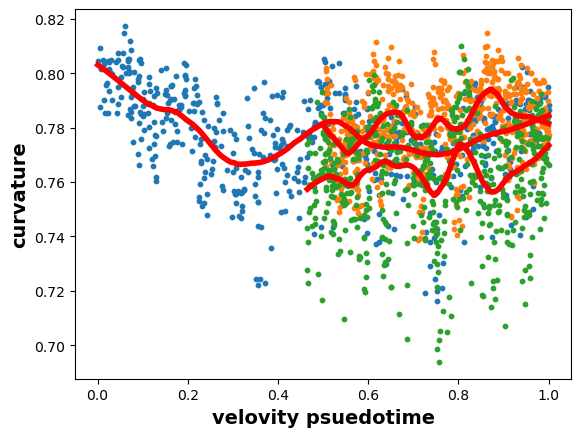

In [66]:
mask,x_ls,y_ls= kde_lowess(color_label[:branch_length], crcs_smooth[1,:branch_length])
plt.scatter(color_label[:branch_length][mask], crcs_smooth[1,:branch_length][mask],s=10,cmap=plt.cm.jet)
plt.plot(x_ls, y_ls, linewidth=4,color='red')
mask,x_ls,y_ls= kde_lowess(color_label[branch_length:2*branch_length], crcs_smooth[1,branch_length:2*branch_length])
plt.scatter(color_label[branch_length:2*branch_length][mask], crcs_smooth[1,branch_length:2*branch_length][mask],s=10,cmap=plt.cm.jet)
plt.plot(x_ls, y_ls, linewidth=4,color='red')
mask,x_ls,y_ls= kde_lowess(color_label[2*branch_length:], crcs_smooth[1,2*branch_length:])
plt.scatter(color_label[2*branch_length:][mask], crcs_smooth[1,2*branch_length:][mask],s=10,cmap=plt.cm.jet)
plt.plot(x_ls, y_ls, linewidth=4,color='red')
plt.xlabel('velovity psuedotime',fontsize=14,weight='bold')
plt.ylabel('curvature',fontsize=14,weight='bold')

In [97]:
mu, sigma = encoder(torch.tensor(X))
mu_learned = mu.detach().numpy()
sigma_learned = sigma.detach().numpy()
diag_elements = np.concatenate([1 / sigma_learned ** 2, 2 / sigma_learned ** 2], axis=-1)
Fisher_g = np.zeros((X.shape[0], 2 * L, 2 * L))
for i in range(X.shape[0]):
    np.fill_diagonal(Fisher_g[i], diag_elements[i])
np.save(result_path+'Fisher_g',Fisher_g)

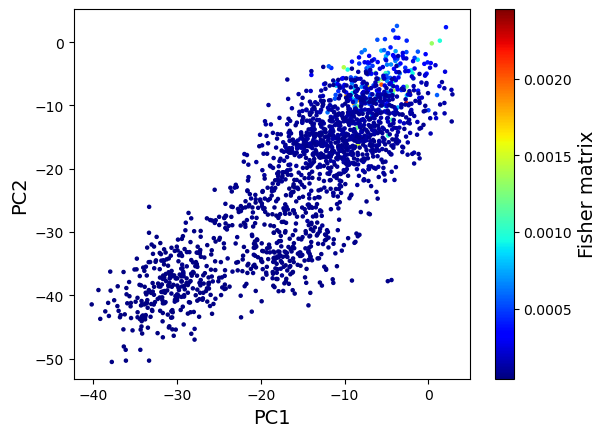

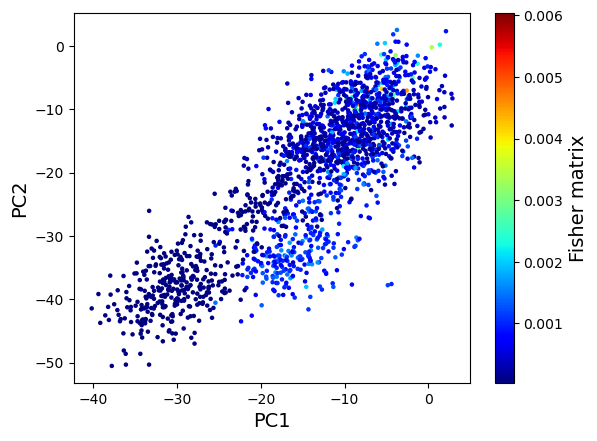

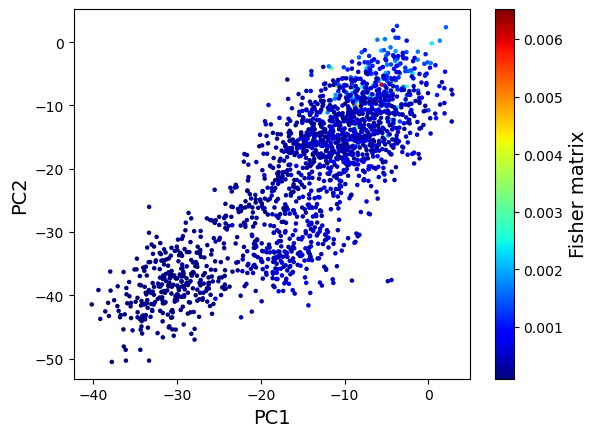

In [69]:
for i in range(L):
    plt.scatter(X_plt,Y_plt,s=5,c=Fisher_g[:,i,i],cmap=plt.cm.jet)
    plt.xlabel('PC1',fontsize=14)
    plt.ylabel('PC2',fontsize=14)
    clb=plt.colorbar()
    clb.ax.set_ylabel('Fisher matrix',fontsize=14)
    plt.savefig(result_path+'g_'+str(i)+'.png')
    plt.show()

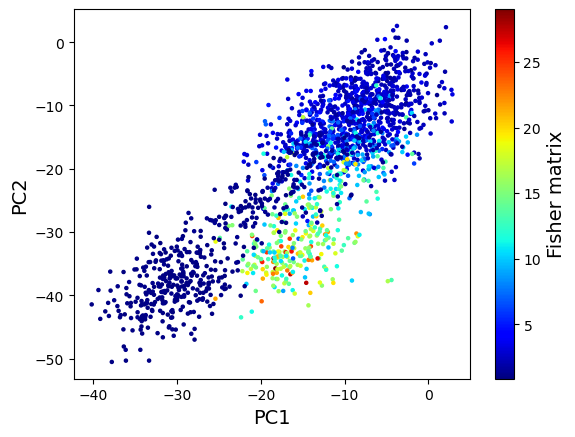

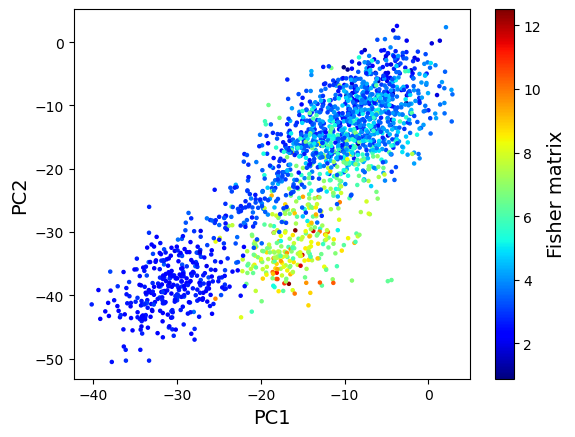

In [70]:
for i in range(1,L):
    Relative_eigen = Fisher_g[:,i,i]/Fisher_g[:,0,0]
    plt.scatter(X_plt,Y_plt,s=5,c=Relative_eigen,cmap=plt.cm.jet)
    plt.xlabel('PC1',fontsize=14)
    plt.ylabel('PC2',fontsize=14)
    clb=plt.colorbar()
    clb.ax.set_ylabel('Fisher matrix',fontsize=14)
    plt.savefig(result_path+'relative_g_'+str(i)+'.png')
    plt.show()

## PCA

In [71]:
from sklearn.decomposition import PCA

In [85]:
pca = PCA(50)
pca = pca.fit(tree)
tree_pca = pca.transform(tree)

In [86]:
tree_pca.shape

(1800, 50)

In [101]:
phate_operator = phate.PHATE(n_jobs=-2)
tree_pca_phate = phate_operator.fit_transform(tree_pca)

Calculating PHATE...
  Running PHATE on 1800 observations and 50 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 0.10 seconds.
    Calculating affinities...
    Calculated affinities in 0.02 seconds.
  Calculated graph and diffusion operator in 0.12 seconds.
  Calculating optimal t...
    Automatically selected t = 9
  Calculated optimal t in 2.48 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.58 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 4.92 seconds.
Calculated PHATE in 8.13 seconds.


C:\Users\76745\AppData\Local\Temp\ipykernel_29320\3960582868.py:1: DeprecationWarning: Call to deprecated function (or staticmethod) scatter2d. (Use scprep.plot.scatter2d instead) -- Deprecated since version 1.0.0.
  phate.plot.scatter2d(tree_pca_phate, c=branches, figsize=(8,6))


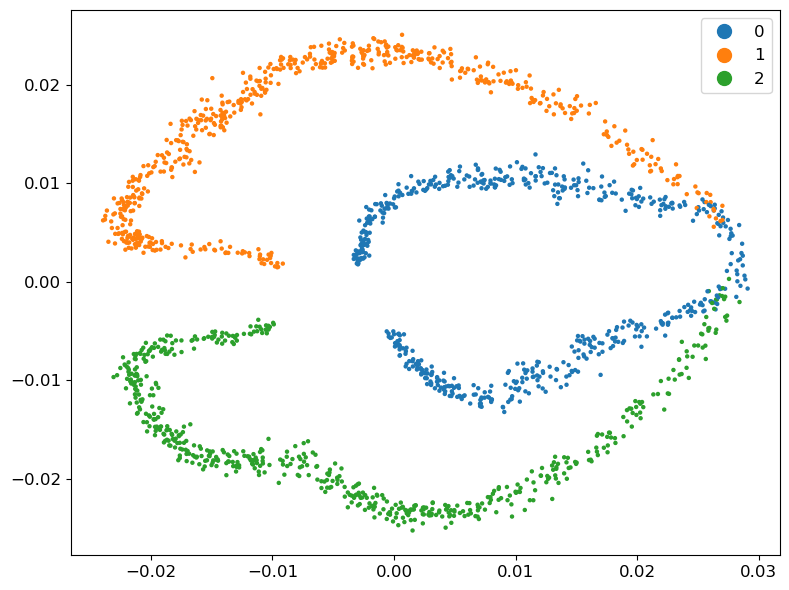

Calculating PHATE...
  Running PHATE on 1800 observations and 50 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 0.07 seconds.
    Calculating affinities...
  Calculated graph and diffusion operator in 0.09 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 1.14 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 4.58 seconds.
Calculated PHATE in 5.83 seconds.


C:\Users\76745\AppData\Local\Temp\ipykernel_29320\3960582868.py:6: DeprecationWarning: Call to deprecated function (or staticmethod) scatter2d. (Use scprep.plot.scatter2d instead) -- Deprecated since version 1.0.0.
  phate.plot.scatter2d(tree_pca_phate_sqrt, c=branches, figsize=(8,6))


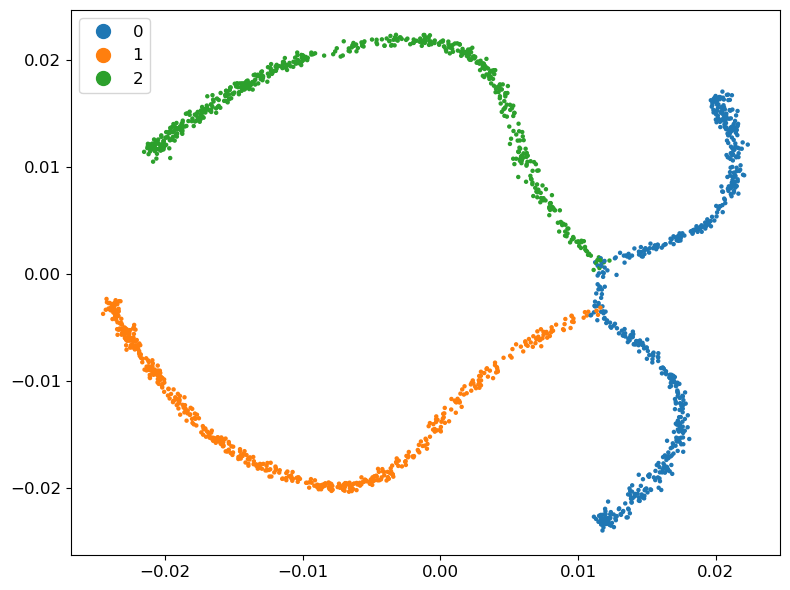

<Axes: >

In [104]:
phate.plot.scatter2d(tree_pca_phate, c=branches, figsize=(8,6))

phate_operator.set_params(gamma=0, t=120)
tree_pca_phate_sqrt = phate_operator.fit_transform(tree_pca)

phate.plot.scatter2d(tree_pca_phate_sqrt, c=branches, figsize=(8,6))

Calculating metric MDS...


C:\Users\76745\AppData\Local\Temp\ipykernel_29320\3513854282.py:1: DeprecationWarning: Call to deprecated function (or staticmethod) scatter3d. (Use scprep.plot.scatter3d instead) -- Deprecated since version 1.0.0.
  phate.plot.scatter3d(phate_operator, c=branches, figsize=(8,6))
C:\Users\76745\anaconda3\envs\pytorch\lib\site-packages\sklearn\manifold\_mds.py:298: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


Calculated metric MDS in 26.82 seconds.


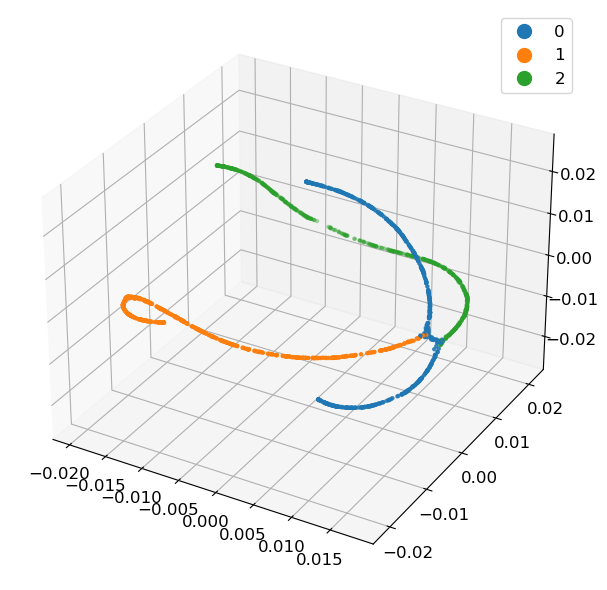

<Axes3D: >

In [106]:
phate.plot.scatter3d(phate_operator, c=branches, figsize=(8,6))

In [107]:
X_pca_major = phate.plot._get_plot_data(phate_operator,ndim=3)
X_pca_major.shape

(1800, 3)

In [109]:
X_pca_minor=0.005*np.random.randn(n_samples,7)
X_pca = np.hstack((X_pca_major,X_pca_minor))
X_pca.shape

(1800, 10)

In [171]:
tree_pca

array([[-7.76786987e+00, -7.05654672e+01,  8.87473248e+01, ...,
         2.09126039e+00,  5.80279291e+00, -1.44799876e+00],
       [-1.50372513e+01, -7.33187233e+01,  7.33286136e+01, ...,
         7.60589281e+00,  2.19024953e+00,  4.26023227e-02],
       [-2.40609531e+00, -5.99390733e+01,  9.20271655e+01, ...,
        -6.15444366e+00, -3.62996935e+00,  1.46040603e+00],
       ...,
       [-1.15915356e+02,  7.53113653e+01, -4.16483817e+00, ...,
         5.98697284e+00, -3.58608065e+00,  5.21272061e+00],
       [-1.18550658e+02,  8.45237633e+01, -5.88651398e+00, ...,
        -3.66643223e+00,  3.27589974e-01, -6.08787245e+00],
       [-1.19766124e+02,  7.81866586e+01, -1.51806348e+01, ...,
        -3.84938655e+00, -6.29545311e+00, -1.06015374e+00]])

In [188]:
####不用phate处理
#X = tree_pca
X = X_pca

k_nei = 10
A = kneighbors_graph(X, k_nei, mode='connectivity', include_self=True)
# A=radius_neighbors_graph(X,3,include_self=True)
X_major = X

row =np.array([np.ones((k_nei,))*i for i in range(n_samples)]).flatten()
col=A.indices
w_val=np.array([np.linalg.norm(X_major[int(i),:]-X_major[int(j),:]) for i,j in zip(row,col)])
dc=np.mean(w_val)

cell_nei=A.indices.reshape(X.shape[0],10)
nei_w=[]
rho_arr=[]
for ni in cell_nei:
    dij=np.array([np.linalg.norm(X_major[int(ni[0]),:]-X_major[int(i),:]) for i in ni[1:]])
    rho=np.sum(np.exp(-dij**2/dc**2))
#     rho=np.exp(np.sum(-dij**2/dc**2))
    nei_w.append(np.exp(-dij**2/dc**2)/np.sum(np.exp(-dij**2/dc**2)))
#     print(dij)
#     print(np.exp(-dij**2/dc**2)/np.sum(np.exp(-dij**2/dc**2)))
    rho_arr.append(rho)
rho_arr=np.array(rho_arr)/np.amax(rho_arr)
nei_w=np.array(nei_w)
nei_w=np.hstack((np.ones((nei_w.shape[0],1)),nei_w))/2

# plt.scatter(X_pca[:,0],X_pca[:,1],s=5,c=rho_arr,cmap=plt.cm.jet)
# plt.colorbar()
# plt.show()

def smooth_func(X_val,cell_nei=cell_nei,nei_w=nei_w):
    X_s=X_val.copy()
    for ci in range(len(X_val)):
        X_s[ci]=np.dot(X_val[cell_nei[ci,:]],nei_w[ci,:])
    return X_s

In [23]:
epochs = 200
nsamples = 3
learning_rate = 1e-3
# n_workers = 4
K = 4
L = 3
#     checkpoint_path = args.checkpoint
#     checkpoints_path = args.checkpoints
#     dataset_path = args.dataset

In [190]:
kk = 2
for i in range(kk):
    reset_seeds(i*2+1)
    A=A.astype(np.float32)
    X=X.astype(np.float32)
    z=color_label

    n = A.shape[0]
    train_nodes, val_nodes = train_test_split(n, train_ratio=1)
    A_train = A[train_nodes, :][:, train_nodes]
    X_train = X[train_nodes]
    z_train = z[train_nodes]
    A_val = A[val_nodes, :][:, val_nodes]
    X_val = X[val_nodes]
    z_val = z[val_nodes]

    train_data = AttributedGraph(A_train, X_train, z_train, K)
    val_data = AttributedGraph(A_val, X_val, z_val, K)
    
    encoder = Encoder(X.shape[1], L)
    optimizer = optim.Adam(encoder.parameters(), lr=learning_rate)
    iterations = epochs #// n_workers
    dataset = GraphDataset(train_data, nsamples, iterations)
    loader = DataLoader(
        dataset,
        batch_size=1,
        #num_workers=n_workers,
        worker_init_fn=reset_seeds,
        collate_fn=lambda args: args,
    )
    
    for batch_idx, data in enumerate(loader):
        encoder.train()
        optimizer.zero_grad()

        loss = encoder.compute_loss(data[0][0],data[0][1],data[0][2],data[0][3],data[0][4],data[0][5])

        if batch_idx% 10 == 0:
            print(batch_idx,loss)
        loss.backward()
        optimizer.step()
        
    torch.save(encoder,result_path+'encoder'+str(i)+'.pt')
    
    mu, sigma = encoder(torch.FloatTensor(X))
    X_mu = mu.detach().numpy()
    X_sigma = sigma.detach().numpy()#The learned sigma is variance

#     cRc_arr=[]
    cRc_arr_eu=[]
#     cRc_arr_mueu=[]
    mu_learned = X_mu
    sigma_learned = X_sigma

    for inds in np.split(A.indices, A.indptr)[1:-1]:
        self_ind=inds[0]
#         cRc=0
        cRc_eu=0
#         cRc_mueu=0
        for nei_k in range(1,len(inds)):
            dEu=np.linalg.norm(X[self_ind,:]-X[inds[nei_k],:])
#             dMuEu=np.linalg.norm(X_mu[self_ind,:]-X_mu[inds[nei_k],:])
#             dFi=Fisher_dist(mu_learned[self_ind,:],sigma_learned[self_ind,:],\
#                             mu_learned[inds[nei_k],:],sigma_learned[inds[nei_k],:])
            dWa=wasserstein_distance(mu_learned[self_ind,:],sigma_learned[self_ind,:],\
                            mu_learned[inds[nei_k],:],sigma_learned[inds[nei_k],:])

#             cRc += 1-dWa/dFi
            cRc_eu += 1-dWa/dEu
#             cRc_mueu += 1-dWa/dMuEu

#         cRc_arr.append(cRc/len(inds))
        cRc_arr_eu.append(cRc_eu/len(inds))
#         cRc_arr_mueu.append(cRc_mueu/len(inds))
#     orc = np.array(cRc_arr)
    orc_eu = np.array(cRc_arr_eu)
#     orc_mueu = np.array(cRc_arr_mueu)
    
    np.save(result_path+'crc'+str(i),orc_eu)

0 tensor(1.1252e+09, grad_fn=<DivBackward0>)
10 tensor(1.0980e+09, grad_fn=<DivBackward0>)
20 tensor(1.0238e+09, grad_fn=<DivBackward0>)
30 tensor(7.3748e+08, grad_fn=<DivBackward0>)
40 tensor(6.7970e+08, grad_fn=<DivBackward0>)
50 tensor(6.5435e+08, grad_fn=<DivBackward0>)
60 tensor(6.3633e+08, grad_fn=<DivBackward0>)
70 tensor(6.1850e+08, grad_fn=<DivBackward0>)
80 tensor(6.0424e+08, grad_fn=<DivBackward0>)
90 tensor(6.1204e+08, grad_fn=<DivBackward0>)
100 tensor(6.1012e+08, grad_fn=<DivBackward0>)
110 tensor(6.0671e+08, grad_fn=<DivBackward0>)
120 tensor(6.1637e+08, grad_fn=<DivBackward0>)
130 tensor(6.1061e+08, grad_fn=<DivBackward0>)
140 tensor(6.1748e+08, grad_fn=<DivBackward0>)
150 tensor(6.0896e+08, grad_fn=<DivBackward0>)
160 tensor(6.0980e+08, grad_fn=<DivBackward0>)
170 tensor(6.0986e+08, grad_fn=<DivBackward0>)
180 tensor(6.1292e+08, grad_fn=<DivBackward0>)
190 tensor(6.0705e+08, grad_fn=<DivBackward0>)
0 tensor(1.1213e+09, grad_fn=<DivBackward0>)
10 tensor(1.0874e+09, grad

In [19]:
##CRC
kk=2
encoders = [0]*kk
mus = [0]*kk
sgms = [0]*kk
crcs_smooth = [0]*kk
for i in range(kk):
    encoders[i] = torch.load(result_path+'encoder'+str(i)+'.pt')
    mu, sigma = encoders[i](torch.FloatTensor(X))
    mus[i] = mu.detach().numpy()
    sgms[i] = sigma.detach().numpy()
    crcs_smooth[i] = smooth_func(np.load(result_path+'crc'+str(i)+'.npy'))
encoders = np.array(encoders)
mus = np.array(mus)
sgms = np.array(sgms)
crcs_smooth = np.array(crcs_smooth)

In [21]:
encoder = encoders[1]

In [24]:
##FIM
mu, sigma = encoder(torch.tensor(X))
mu_learned = mu.detach().numpy()
sigma_learned = sigma.detach().numpy()
diag_elements = np.concatenate([1 / sigma_learned ** 2, 2 / sigma_learned ** 2], axis=-1)
Fisher_g = np.zeros((X.shape[0], 2 * L, 2 * L))
for i in range(X.shape[0]):
    np.fill_diagonal(Fisher_g[i], diag_elements[i])
np.save(result_path+'Fisher_g',Fisher_g)

In [30]:
def EigenIF(Fisher_g):
    n,L,_ = Fisher_g.shape
    L=int(L/2)
    Eigenvalue = np.zeros((n,L))
    for i in range(n):
        for j in range(L):
            Eigenvalue[i,j] = Fisher_g[i,j,j]
    sorted_Eigenvalue = np.sort(Eigenvalue, axis=1)
    sorted_Eigenvalue = sorted_Eigenvalue[:, ::-1]
    relative_Eigenvalue = sorted_Eigenvalue[:,1:]/sorted_Eigenvalue[:,0].reshape(n,1)
    return Eigenvalue,sorted_Eigenvalue,relative_Eigenvalue

In [31]:
Eigenvalue,sorted_Eigenvalue,relative_Eigenvalue = EigenIF(Fisher_g)

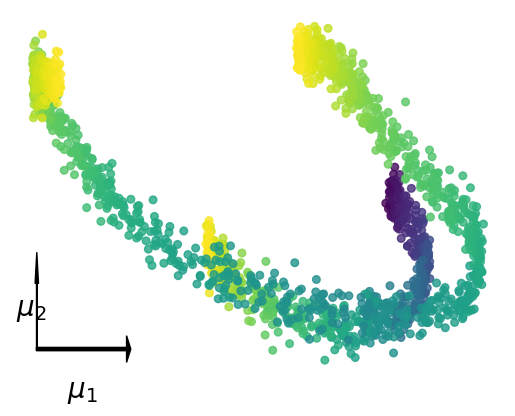

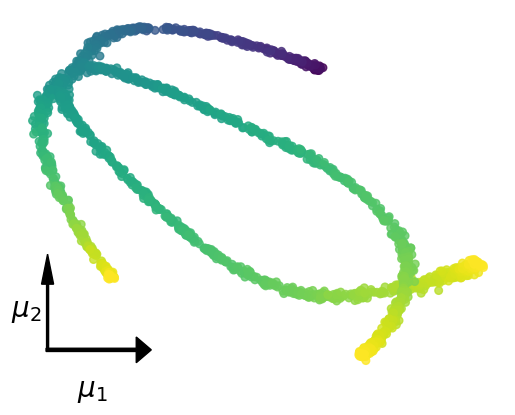

In [27]:
for nkk in range(kk):
    X_plt = mus[nkk,:,0]
    Y_plt = mus[nkk,:,1]
    X_min = np.min(X_plt)
    X_max = np.max(X_plt)
    Y_min = np.min(Y_plt)
    Y_max = np.max(Y_plt)
    X_len = (X_max-X_min)/5
    Y_len = (Y_max-Y_min)/5
    wid = min(X_len,Y_len)/30
    X_ori = X_min+5*wid
    Y_ori = Y_min+5*wid
    
    plt.scatter(X_plt,Y_plt,s=30,alpha=0.8,c=color_label,cmap='viridis')
    plt.axis('off')
    
    plt.arrow(X_ori-wid/2,Y_ori,X_len,0,width=wid*1.5,color='black',head_width=12*wid,head_length=5*wid)
    plt.arrow(X_ori,Y_ori-wid/2,0,Y_len,width=wid*2/3,color='black',head_width=4*wid,head_length=14*wid)
    
    plt.text(X_ori+X_len/2,Y_ori-wid*22,'$\mu_1$',fontsize=20,ha='center',weight='bold')
    plt.text(X_ori-wid*7,Y_ori+Y_len/2,'$\mu_2$',fontsize=20,ha='center',weight='bold')
    
    # plt.savefig(result_path+model_name+'_mu.png',dpi=600,bbox_inches='tight')
    plt.show()

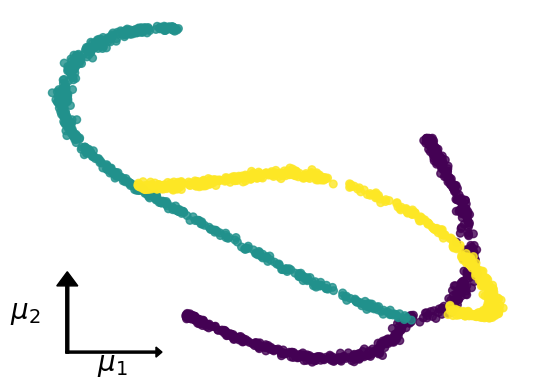

In [196]:
nkk = 1
X_plt = mus[nkk,:,0]
Y_plt = mus[nkk,:,1]
X_min = np.min(X_plt)
X_max = np.max(X_plt)
Y_min = np.min(Y_plt)
Y_max = np.max(Y_plt)
X_len = (X_max-X_min)/5
Y_len = (Y_max-Y_min)/5
wid = min(X_len,Y_len)/30
X_ori = X_min+5*wid
Y_ori = Y_min+5*wid

plt.scatter(X_plt,Y_plt,s=30,alpha=0.8,c=branches,cmap='viridis')
plt.axis('off')

plt.arrow(X_ori-wid/2,Y_ori,X_len,0,width=wid,color='black',head_width=5*wid,head_length=kk*wid)
plt.arrow(X_ori,Y_ori-wid/2,0,Y_len,width=wid,color='black',head_width=7*wid,head_length=7*wid)

plt.text(X_ori+X_len/2,Y_ori-wid*9,'$\mu_1$',fontsize=20,ha='center',weight='bold')
plt.text(X_ori-wid*14,Y_ori+Y_len/2,'$\mu_2$',fontsize=20,ha='center',weight='bold')

plt.savefig(figure_path+'2b1.png',dpi=600,bbox_inches='tight')
plt.show()

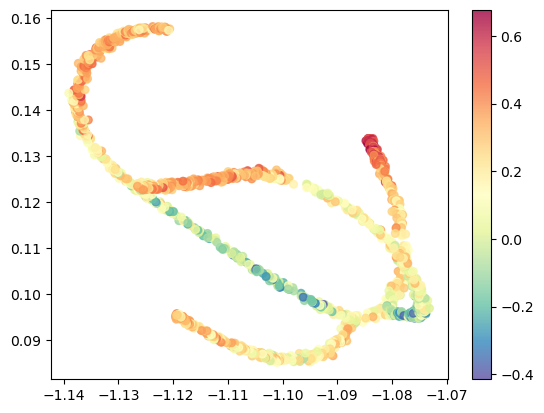

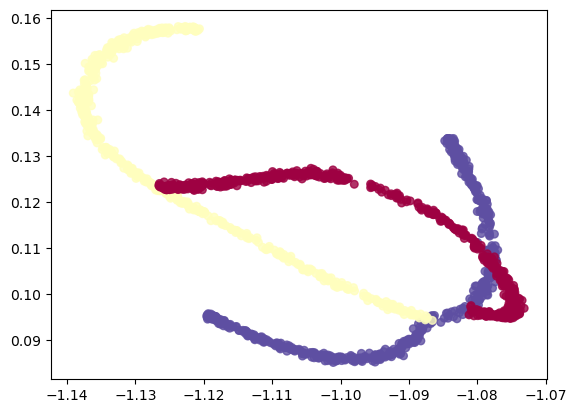

In [197]:
plt.scatter(
    X_plt,Y_plt, c=crcs_smooth[1,:], s=30, alpha=0.8,cmap=cmap
    # X[:, 0], X[:, 1], c=np.mean(crcs_smooth,axis=0), s=30, alpha=0.8,cmap=cmap
)
plt.colorbar()
plt.show()
plt.scatter(
    X_plt,Y_plt, c=branches, s=30, alpha=0.8,cmap=cmap
    # X[:, 0], X[:, 1], c=np.mean(crcs_smooth,axis=0), s=30, alpha=0.8,cmap=cmap
)
plt.show()

In [6]:
def PLT_Fisher(X_plt,Y_plt,matrix,name):
    n,L = matrix.shape
    L = L
    for i in range(L):
        plt.scatter(X_plt,Y_plt,s=5,c=matrix[:,i],cmap=plt.cm.jet)
        plt.xlabel('PC1',fontsize=14)
        plt.ylabel('PC2',fontsize=14)
        clb=plt.colorbar()
        clb.ax.set_ylabel(name+str(i),fontsize=14)
        plt.savefig(result_path+name+str(i)+'.png')
        plt.show()
    return None

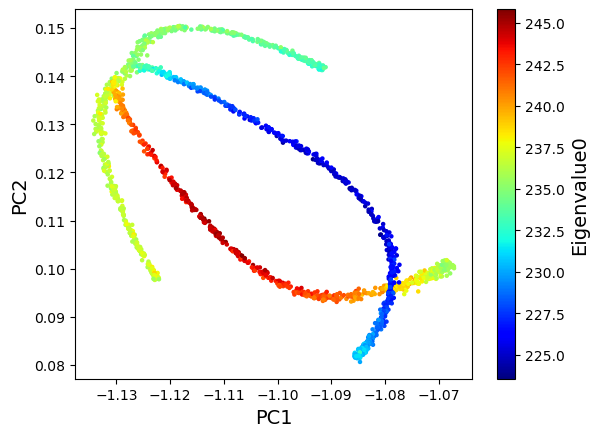

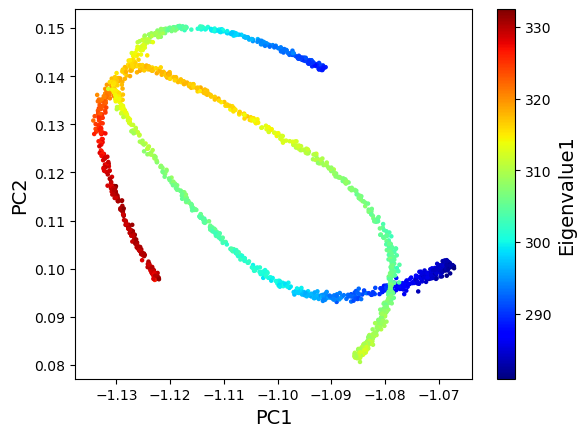

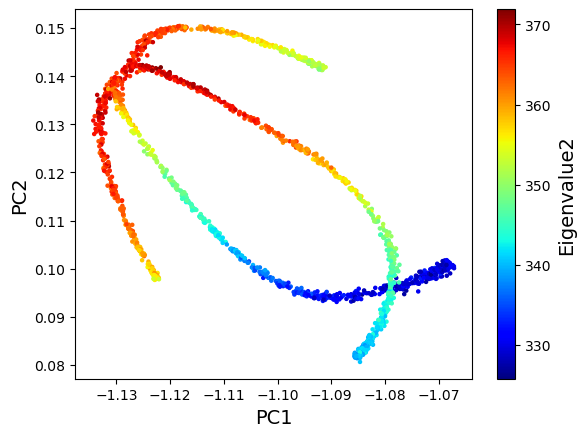

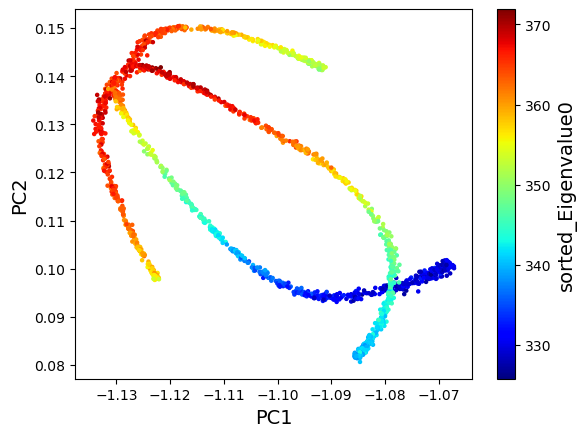

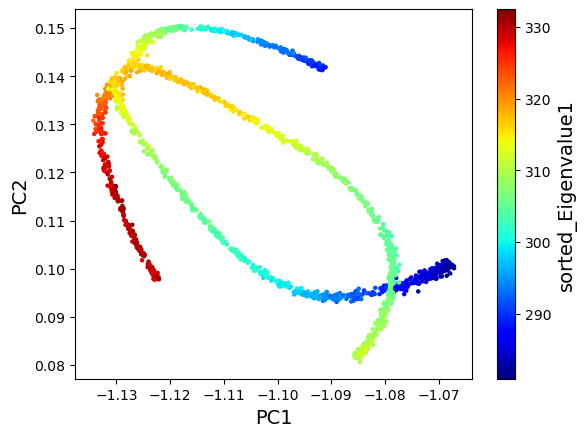

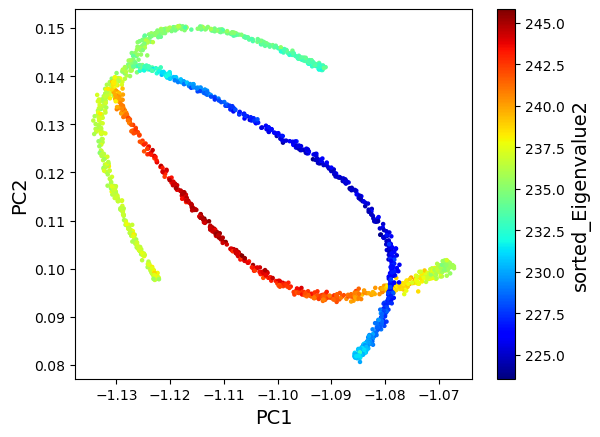

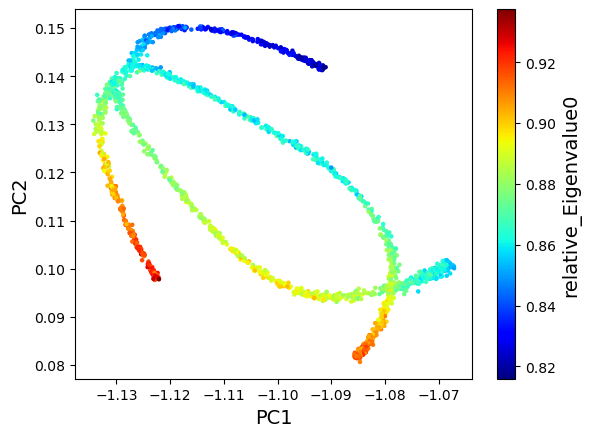

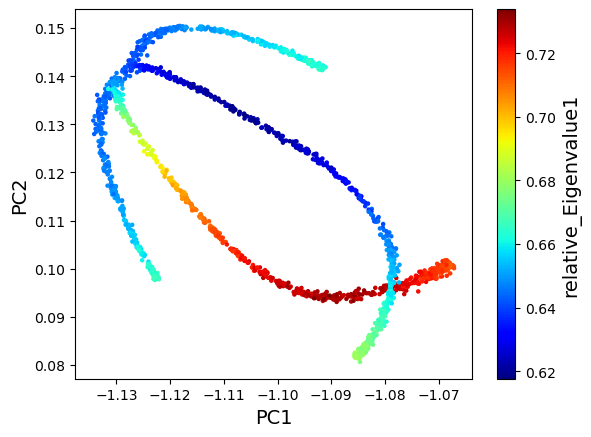

In [33]:
PLT_Fisher(X_plt,Y_plt,Eigenvalue,'Eigenvalue')
PLT_Fisher(X_plt,Y_plt,sorted_Eigenvalue,'sorted_Eigenvalue')
PLT_Fisher(X_plt,Y_plt,relative_Eigenvalue,'relative_Eigenvalue')

Text(0, 0.5, 'curvature')

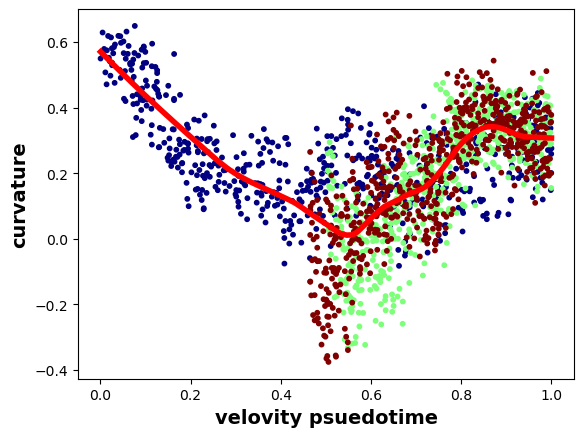

In [200]:
mask,x_ls,y_ls= kde_lowess(color_label, crcs_smooth[1,:])
plt.scatter(color_label[mask], crcs_smooth[1,mask],s=10,c=branches[mask],cmap=plt.cm.jet)
plt.plot(x_ls, y_ls, linewidth=4,color='red')
plt.xlabel('velovity psuedotime',fontsize=14,weight='bold')
plt.ylabel('curvature',fontsize=14,weight='bold')

C:\Users\76745\AppData\Local\Temp\ipykernel_29320\3342221902.py:2: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(color_label[:branch_length][mask], crcs_smooth[1,:branch_length][mask],s=10,cmap=plt.cm.jet)
C:\Users\76745\AppData\Local\Temp\ipykernel_29320\3342221902.py:5: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(color_label[branch_length:2*branch_length][mask], crcs_smooth[1,branch_length:2*branch_length][mask],s=10,cmap=plt.cm.jet)
C:\Users\76745\AppData\Local\Temp\ipykernel_29320\3342221902.py:8: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(color_label[2*branch_length:][mask], crcs_smooth[1,2*branch_length:][mask],s=10,cmap=plt.cm.jet)


Text(0, 0.5, 'curvature')

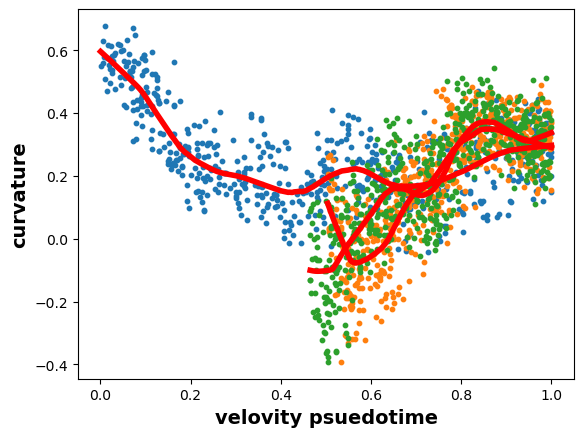

In [201]:
mask,x_ls,y_ls= kde_lowess(color_label[:branch_length], crcs_smooth[1,:branch_length])
plt.scatter(color_label[:branch_length][mask], crcs_smooth[1,:branch_length][mask],s=10,cmap=plt.cm.jet)
plt.plot(x_ls, y_ls, linewidth=4,color='red')
mask,x_ls,y_ls= kde_lowess(color_label[branch_length:2*branch_length], crcs_smooth[1,branch_length:2*branch_length])
plt.scatter(color_label[branch_length:2*branch_length][mask], crcs_smooth[1,branch_length:2*branch_length][mask],s=10,cmap=plt.cm.jet)
plt.plot(x_ls, y_ls, linewidth=4,color='red')
mask,x_ls,y_ls= kde_lowess(color_label[2*branch_length:], crcs_smooth[1,2*branch_length:])
plt.scatter(color_label[2*branch_length:][mask], crcs_smooth[1,2*branch_length:][mask],s=10,cmap=plt.cm.jet)
plt.plot(x_ls, y_ls, linewidth=4,color='red')
plt.xlabel('velovity psuedotime',fontsize=14,weight='bold')
plt.ylabel('curvature',fontsize=14,weight='bold')

In [124]:
Fisher_g.shape

(1800, 6, 6)

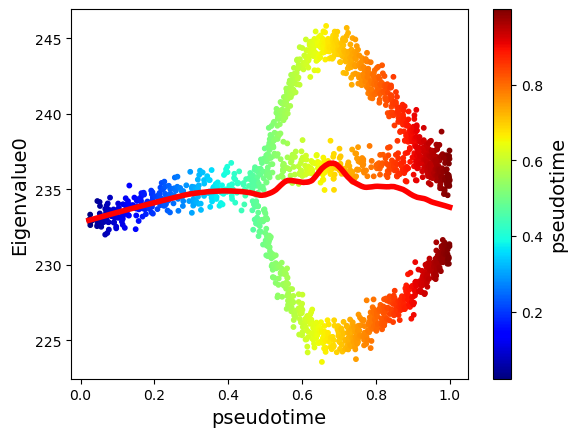

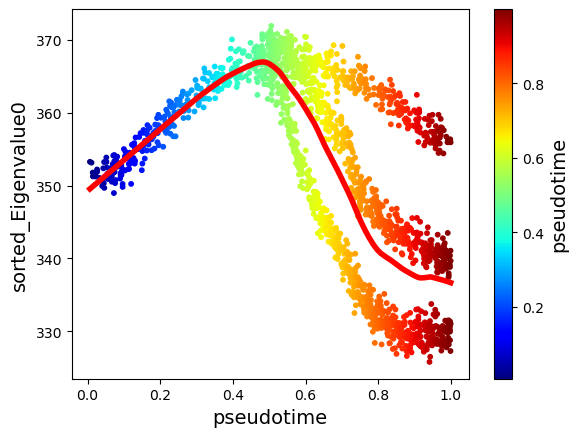

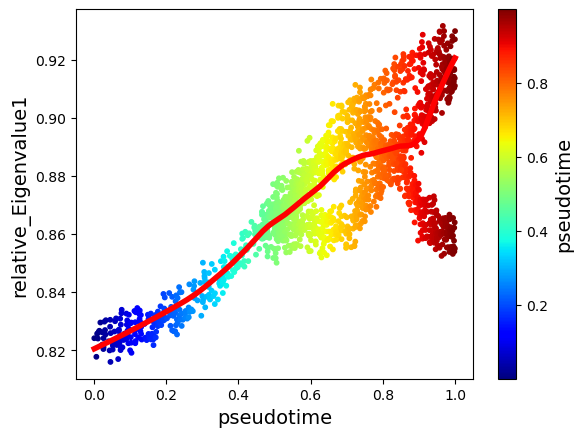

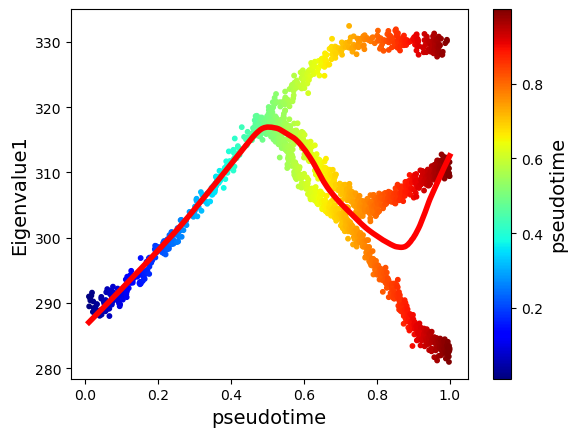

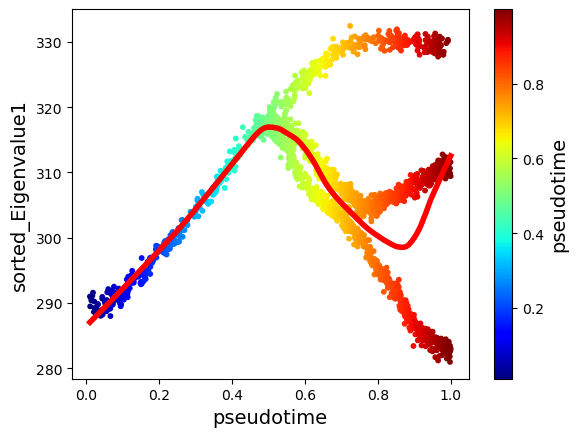

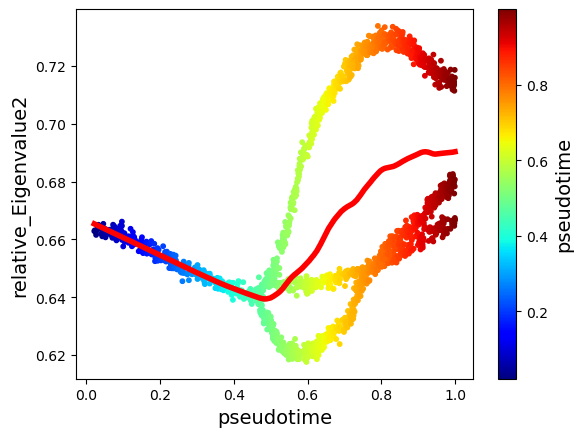

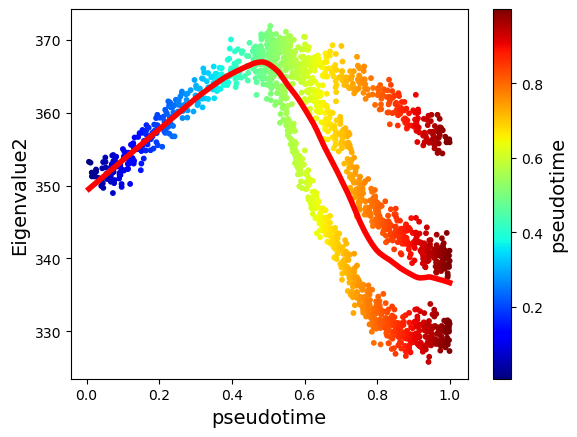

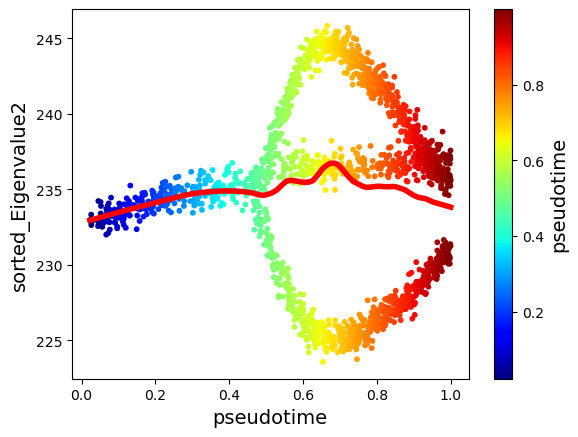

In [32]:
cell_vpt = color_label
def plt_mask(VEC,name):
    mask,x_ls,y_ls= kde_lowess(cell_vpt,VEC)
    plt.scatter(cell_vpt[mask], VEC[mask],s=10,c=cell_vpt[mask],cmap=plt.cm.jet)
    plt.plot(x_ls, y_ls, linewidth=4,color='red')
    plt.xlabel('pseudotime',fontsize=14)
    plt.ylabel(name,fontsize=14)
    # sns.kdeplot(cell_vpt,cRc_smooth,bw_adjust=0.7)
    clb=plt.colorbar()
    clb.ax.set_ylabel('pseudotime',fontsize=14)
    plt.savefig(result_path+name+'vpt_cv_kde.png')
    plt.show()
for i in range(L):
    plt_mask(Eigenvalue[:,i],'Eigenvalue'+str(i))
    plt_mask(sorted_Eigenvalue[:,i],'sorted_Eigenvalue'+str(i))
    if i == L-1:
        break
    plt_mask(relative_Eigenvalue[:,i],'relative_Eigenvalue'+str(i+1))
